<a href="https://colab.research.google.com/github/Talzaidman/speech/blob/main/originalmodel.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### **Drive - Data Set**

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### **Clone Paper Code**

In [3]:

# Clone the repository
!git lfs install
!git clone https://github.com/dmlguq456/SepReformer.git
%cd SepReformer

# Install dependencies
!pip install -r requirements.txt
# Note: The repo recommends Python 3.10, which is currently the Colab standard.

!pip install loguru torchinfo ptflops thop mir_eval

Git LFS initialized.
Cloning into 'SepReformer'...
remote: Enumerating objects: 673, done.
remote: Counting objects: 100% (298/298), done.
remote: Compressing objects: 100% (59/59), done.
remote: Total 673 (delta 262), reused 239 (delta 239), pack-reused 375 (from 1)
Receiving objects: 100% (673/673), 8.43 MiB | 12.97 MiB/s, done.
Resolving deltas: 100% (418/418), done.
/content/SepReformer
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 163.7/163.7 kB 18.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.7/90.7 kB 12.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 kB 10.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.8/60.8 kB 7.3 MB/s eta 0:00:00
ERROR: Ignored the following versions that require a different python version: 1.10.0 Requires-Python <3.12,>=3.8; 1.10.0rc1 Requires-Python <3.12,>=3.8; 1.10.0rc

In [4]:
import os
import random
import zipfile

# Configuration
zip_path = '/content/librimix_extension.zip'
# Extract to local content for speed
extract_path = '/content/dataset'
scp_output_dir = '/content/SepReformer/data/custom'
subfolders = ['s1', 's2', 'mix_clean']

os.makedirs(scp_output_dir, exist_ok=True)

# 0. Unzip the dataset
if not os.path.exists(extract_path):
    print(f"Checking for dataset zip...")
    # Check if local path exists, if not try drive path as fallback
    if not os.path.exists(zip_path):
        drive_zip = '/content/drive/MyDrive/תואר/speech/librimix_extension.zip'
        if os.path.exists(drive_zip):
            print(f"Zip found at {drive_zip}, using that.")
            zip_path = drive_zip
        else:
            # Try one more common location or fail
            if not os.path.exists(zip_path):
                 print(f"Warning: Zip file not found at {zip_path}.")

    print(f"Extracting {zip_path} to {extract_path}...")
    try:
        with zipfile.ZipFile(zip_path, 'r') as zip_ref:
            zip_ref.extractall(extract_path)
        print("Extraction complete.")
    except Exception as e:
        print(f"Error extracting zip: {e}")
        # If extraction failed, ensure we don't leave partial state that blocks retry
else:
    print(f"Dataset already extracted at {extract_path}")

base_path = extract_path

# 1. Get list of file names
s1_dir = os.path.join(base_path, 's1')
if not os.path.exists(s1_dir):
    # If s1 isn't top level, check if it's inside a folder with the zip name (common issue)
    # But user specified top-level structure.
    print(f"Error: {s1_dir} not found. Please check zip structure.")
    files = []
else:
    files = sorted([f for f in os.listdir(s1_dir) if f.endswith('.wav')])
    print(f"Found {len(files)} audio files.")

# 2. Shuffle and Split (80/20)
if files:
    random.seed(42) # For reproducibility
    random.shuffle(files)
    split_idx = int(len(files) * 0.8)

    train_files = files[:split_idx]
    val_files = files[split_idx:]

    # 3. Generate the SCP files
    def create_scp(file_list, set_name):
        for folder in subfolders:
            output_path = os.path.join(scp_output_dir, f"{set_name}_{folder}.scp")
            with open(output_path, 'w') as f:
                for filename in file_list:
                    full_path = os.path.join(base_path, folder, filename)
                    # ID format: filename (must be unique)
                    f.write(f"{filename} {full_path}\n")
            print(f"Created {output_path} with {len(file_list)} files.")

    create_scp(train_files, "train")
    create_scp(val_files, "val")
else:
    print("No files found to process.")

Checking for dataset zip...
Zip found at /content/drive/MyDrive/תואר/speech/librimix_extension.zip, using that.
Extracting /content/drive/MyDrive/תואר/speech/librimix_extension.zip to /content/dataset...
Extraction complete.
Found 14900 audio files.
Created /content/SepReformer/data/custom/train_s1.scp with 11920 files.
Created /content/SepReformer/data/custom/train_s2.scp with 11920 files.
Created /content/SepReformer/data/custom/train_mix_clean.scp with 11920 files.
Created /content/SepReformer/data/custom/val_s1.scp with 2980 files.
Created /content/SepReformer/data/custom/val_s2.scp with 2980 files.
Created /content/SepReformer/data/custom/val_mix_clean.scp with 2980 files.


In [5]:
import os
import textwrap
import torch

# 1. Set Working Directory
%cd /content/SepReformer

# 3. Write Configuration
print("⚙️ Writing config file...")
config_content = """
project: "[Project] SepReformer"
notes: "Training on custom dataset - Fixed Scheduler"

config:
    dataset:
        max_len: 32000
        sampling_rate: 8000
        scp_dir: "data/custom"
        train:
            mixture: "train_mix_clean.scp"
            spk1: "train_s1.scp"
            spk2: "train_s2.scp"
            dynamic_mixing: true
        valid:
            mixture: "val_mix_clean.scp"
            spk1: "val_s1.scp"
            spk2: "val_s2.scp"
        test:
            mixture: "val_mix_clean.scp"
            spk1: "val_s1.scp"
            spk2: "val_s2.scp"

    dataloader:
        batch_size: 1
        pin_memory: true
        num_workers: 4
        drop_last: true

    model:
        num_stages: 4
        num_spks: 2
        module_audio_enc:
            in_channels: 1
            out_channels: 256
            kernel_size: 16
            stride: 4
            groups: 1
            bias: false
        module_feature_projector:
            num_channels: 256
            in_channels: 256
            out_channels: 128
            kernel_size: 1
            bias: false
        module_separator:
            num_stages: 4
            relative_positional_encoding:
                in_channels: 128
                num_heads: 8
                maxlen: 2000
                embed_v: false
            enc_stage:
                global_blocks:
                    in_channels: 128
                    num_mha_heads: 8
                    dropout_rate: 0.05
                local_blocks:
                    in_channels: 128
                    kernel_size: 65
                    dropout_rate: 0.05
                down_conv_layer:
                    in_channels: 128
                    samp_kernel_size: 5
            spk_split_stage:
                in_channels: 128
                num_spks: 2
            simple_fusion:
                out_channels: 128
            dec_stage:
                num_spks: 2
                global_blocks:
                    in_channels: 128
                    num_mha_heads: 8
                    dropout_rate: 0.05
                local_blocks:
                    in_channels: 128
                    kernel_size: 65
                    dropout_rate: 0.05
                spk_attention:
                    in_channels: 128
                    num_mha_heads: 8
                    dropout_rate: 0.05
        module_output_layer:
            in_channels: 256
            out_channels: 128
            num_spks: 2
        module_audio_dec:
            in_channels: 256
            out_channels: 1
            kernel_size: 16
            stride: 4
            bias: false

    criterion:
        name: ["PIT_SISNR_mag", "PIT_SISNR_time", "PIT_SISNRi", "PIT_SDRi"]
        PIT_SISNR_mag:
            frame_length: 512
            frame_shift: 128
            window: 'hann'
            num_stages: 4
            num_spks: 2
            scale_inv: true
            mel_opt: false
        PIT_SISNR_time:
            num_spks: 2
            scale_inv: true
        PIT_SISNRi:
            num_spks: 2
            scale_inv: true
        PIT_SDRi:
            dump: 0

    optimizer:
        name: ["AdamW"]
        AdamW:
            lr: 1.0e-3
            weight_decay: 1.0e-2

    scheduler:
        name: ["ReduceLROnPlateau", "WarmupConstantSchedule"]
        ReduceLROnPlateau:
            mode: "min"
            min_lr: 1.0e-10
            factor: 0.8
            patience: 2
        WarmupConstantSchedule:
            warmup_steps: 100

    check_computations:
        dummy_len: 16000

    engine:
        max_epoch: 90
        gpuid: "0"
        mvn: false
        clip_norm: 5
        start_scheduling: 10
        test_epochs: [50, 90]
"""
with open("models/SepReformer_Base_WSJ0/configs.yaml", "w") as f:
    f.write(config_content)
!rm -rf models/SepReformer_Base_WSJ0/log

# 4. Patch dataset.py
print("🔧 Patching dataset.py...")
dataset_path = 'models/SepReformer_Base_WSJ0/dataset.py'
with open(dataset_path, 'r') as f:
    lines = f.readlines()

new_lines = []
for line in lines:
    if "key.split('_')" in line and "key_random.split('_')" in line:
        indent = line[:line.find("tmp1")]
        new_lines.append(f"{indent}tmp1 = True # Patched\n")
    elif "tmp2 =" in line and "key.split" in line:
        indent = line[:line.find("tmp2")]
        new_lines.append(f"{indent}tmp2 = True # Patched\n")
    elif 'self.speed_aug(torch.tensor(samps_tmp))' in line:
        new_lines.append(f"            # {line.strip()} # PATCHED: Disabled\n")
    else:
        new_lines.append(line)

with open(dataset_path, 'w') as f:
    f.writelines(new_lines)

# 5. Patch engine.py
print("🔧 Patching engine.py...")
engine_path = 'models/SepReformer_Base_WSJ0/engine.py'
with open(engine_path, 'r') as f:
    lines = f.readlines()

new_lines = []
for line in lines:
    if 'util_engine.save_checkpoint_per_best' in line:
        indent = line.split("valid_loss_best")[0]
        new_line = (
            f"{indent}valid_loss_best = util_engine.save_checkpoint_per_best("
            f"valid_loss_best, valid_loss_src_time, train_loss_src_time, epoch, "
            f"self.model, self.main_optimizer, self.checkpoint_path)\n"
        )
        new_lines.append(new_line)
    elif 'writer_src.add_scalars("Learning Rate"' in line:
        new_lines.append(line.replace('add_scalars', 'add_scalar'))
    else:
        new_lines.append(line)

with open(engine_path, 'w') as f:
    f.writelines(new_lines)


/content/SepReformer
⚙️ Writing config file...
🔧 Patching dataset.py...
🔧 Patching engine.py...


In [15]:
import torch
import glob
import os

ckpt_dir = "models/SepReformer_Base_WSJ0/log/scratch_weights"
ckpts = sorted(glob.glob(os.path.join(ckpt_dir, "epoch.*.pth")))

if ckpts:
    latest = ckpts[-1]
    print(f"🔍 Inspecting checkpoint: {latest}")
    try:
        cpt = torch.load(latest, map_location='cpu')
        if isinstance(cpt, dict):
            print(f"🔑 Keys found: {list(cpt.keys())}")
        else:
            print(f"⚠️ Checkpoint is not a dict, it is type: {type(cpt)}")
    except Exception as e:
        print(f"❌ Error loading checkpoint: {e}")
else:
    print("❌ No checkpoints found to inspect.")

🔍 Inspecting checkpoint: models/SepReformer_Base_WSJ0/log/scratch_weights/epoch.0018.pth
🔑 Keys found: ['epoch', 'model_state_dict', 'optimizer_state_dict', 'train_loss', 'valid_loss']


In [ ]:
import os
import yaml
import random
import shutil
import glob
import torch

# --- 0. Setup Environment ---
# Ensure we are in the correct directory for git and relative paths to work
if os.path.exists('/content/SepReformer'):
    os.chdir('/content/SepReformer')
    print(f"📂 Working Directory set to: {os.getcwd()}")
else:
    print("⚠️ Warning: /content/SepReformer directory not found.")

# --- TensorBoard Visualization ---
print("📊 Launching TensorBoard...")
try:
    %load_ext tensorboard
except:
    pass
# Create log dir if it doesn't exist to prevent TB launch errors
os.makedirs("models/SepReformer_Base_WSJ0/log", exist_ok=True)
%tensorboard --logdir models/SepReformer_Base_WSJ0/log

# --- RESET: Ensure Clean State ---
print("🔄 Resetting code files to original state...")
os.system("git checkout models/SepReformer_Base_WSJ0/dataset.py")
os.system("git checkout models/SepReformer_Base_WSJ0/engine.py")

# --- FIX: Patch dataset.py ---
print("🔧 Patching dataset.py...")
dataset_path = 'models/SepReformer_Base_WSJ0/dataset.py'
if os.path.exists(dataset_path):
    with open(dataset_path, 'r') as f:
        lines = f.readlines()

    new_lines = []
    for line in lines:
        if "tmp1 =" in line and "key.split" in line:
            indent = line[:line.find("tmp1")]
            new_lines.append(f"{indent}tmp1 = True # Patched\n")
        elif "tmp2 =" in line and "key.split" in line:
            indent = line[:line.find("tmp2")]
            new_lines.append(f"{indent}tmp2 = True # Patched\n")
        elif 'self.speed_aug(torch.tensor(samps_tmp))' in line:
            new_lines.append(f"            # {line.strip()} # PATCHED: Disabled\n")
        else:
            new_lines.append(line)

    with open(dataset_path, 'w') as f:
        f.writelines(new_lines)
else:
    print(f"❌ Error: {dataset_path} not found.")

# --- FIX: Patch engine.py (Loss Logging, Bug Fixes & AUTO-RESUME) ---
print("🔧 Patching engine.py...")
engine_path = 'models/SepReformer_Base_WSJ0/engine.py'
if os.path.exists(engine_path):
    with open(engine_path, 'r') as f:
        lines = f.readlines()

    new_lines_engine = []

    for line in lines:
        # 1. Fix TensorBoard 'add_scalars' bug by disabling the problematic line
        if 'writer_src.add_scalars("Learning Rate"' in line:
            line = f"        # {line.strip()} # PATCHED: Disabled to prevent TB error\n"
            new_lines_engine.append(line)
            continue

        # 2. Inject Logging AND FIX wandb_run error
        if 'util_engine.save_checkpoint_per_best' in line:
             indent = line[:line.find(line.strip()[0])]
             # Inject Logging
             log_code = (f'{indent}try:\n'
                         f'{indent}    with open("loss_log.txt", "a") as f_log: '
                         f'f_log.write(f"{{epoch}},{{float(train_loss_src_time)}},{{float(valid_loss_src_time)}}\\n")\n'
                         f'{indent}except Exception as e: pass\n')
             new_lines_engine.append(log_code)

             # Fix the call by REMOVING self.wandb_run which does not exist
             fixed_call = (
                f"{indent}valid_loss_best = util_engine.save_checkpoint_per_best("
                f"valid_loss_best, valid_loss_src_time, train_loss_src_time, epoch, "
                f"self.model, self.main_optimizer, self.checkpoint_path)\n"
             )
             new_lines_engine.append(fixed_call)
             continue

        # 3. AUTO-RESUME PATCH: Inject Loading Logic in __init__
        if 'self.model = model' in line:
             indent = line[:line.find('self.model')]
             new_lines_engine.append(line) # Keep original line

             resume_code = (
                 f"{indent}# --- PATCH: AUTO RESUME ---\n"
                 f"{indent}import glob\n"
                 f"{indent}ckpt_pattern = os.path.join(\"models\", args.model, \"log\", \"scratch_weights\", \"epoch.*.pth\")\n"
                 f"{indent}ckpts = sorted(glob.glob(ckpt_pattern))\n"
                 f"{indent}self.start_epoch = 0\n"
                 f"{indent}if ckpts:\n"
                 f"{indent}    latest = ckpts[-1]\n"
                 f"{indent}    logger.info(f\"RESUMING: Found checkpoint {{latest}}\")\n"
                 f"{indent}    cpt = torch.load(latest, map_location='cpu')\n"
                 f"{indent}    self.model.load_state_dict(cpt['model_state_dict'], strict=False)\n"
                 f"{indent}    if 'optimizer_state_dict' in cpt: optimizers[0].load_state_dict(cpt['optimizer_state_dict'])\n"
                 f"{indent}    self.start_epoch = int(os.path.basename(latest).split('.')[1]) + 1\n"
                 f"{indent}    logger.info(f\"RESUMING: Starting from epoch {{self.start_epoch}}\")\n"
             )
             new_lines_engine.append(resume_code)
             continue

        # 4. AUTO-RESUME PATCH: Adjust Loop Range
        # Fix: Replaces the loop line completely to avoid argument mismatches (e.g. range(start, start, step))
        if 'for epoch in range(' in line and 'max_epoch' in line:
             indent = line[:line.find('for')]
             # We explicitly set range(start_epoch, max_epoch)
             # getattr used to be safe, but we know self.start_epoch is set by our patch above
             line = f"{indent}for epoch in range(getattr(self, 'start_epoch', 0), self.config['engine']['max_epoch']):\n"
             new_lines_engine.append(line)
             continue

        new_lines_engine.append(line)

    with open(engine_path, 'w') as f:
        f.writelines(new_lines_engine)
    print("✅ Patches applied successfully (Logging + Resume).")
else:
    print(f"❌ Error: {engine_path} not found.")

# Initialize/Clear log file (Only if it doesn't exist, to preserve history on resume)
if not os.path.exists("loss_log.txt"):
    with open("loss_log.txt", "w") as f:
        f.write("epoch,train_loss,val_loss\n")
else:
    print("ℹ️ loss_log.txt exists. Appending to existing history.")

# ----------------------------------------------------------------------

# --- Speed Up Strategy: Train on a Subset (Mini-Epochs) ---
# Set fixed seed so the subset remains the same if we resume training
random.seed(42)

subset_size = 1000
val_subset_size = max(1, int(subset_size // 2))

src_scp_dir = 'data/custom'
tgt_scp_dir = 'data/scp_ss_8k'
config_path = 'models/SepReformer_Base_WSJ0/configs.yaml'

print(f"✂️  Preparing mini-dataset (Train: {subset_size}, Val: {val_subset_size})...")
os.makedirs(tgt_scp_dir, exist_ok=True)

if os.path.exists(src_scp_dir) and os.path.exists(config_path):
    try:
        with open(config_path, 'r') as f:
            config = yaml.safe_load(f)

        # Helper to generate/copy files
        def prepare_set(section_name, files_map, size, is_train=False):
            lines_data = {}
            for key, fname in files_map.items():
                file_path = os.path.join(src_scp_dir, fname)
                if not os.path.exists(file_path):
                    print(f"⚠️ Missing source file: {file_path}")
                    continue
                with open(file_path, 'r') as f:
                    lines_data[key] = f.readlines()

            if not lines_data:
                 return {}

            # Use mixture as reference for length
            num_samples = len(lines_data.get('mixture', []))
            if num_samples == 0 and len(lines_data) > 0:
                 # Fallback to first available key if mixture missing
                 first_key = next(iter(lines_data))
                 num_samples = len(lines_data[first_key])

            new_map = {}

            if num_samples > size:
                indices = sorted(random.sample(range(num_samples), size))
                prefix = "train_mini_" if is_train else "val_mini_"
                for key, fname in files_map.items():
                    if key not in lines_data: continue

                    subset_lines = [lines_data[key][i] for i in indices]
                    # Create Mini File
                    mini_fname = fname.replace("train_", prefix).replace("val_", prefix)
                    with open(os.path.join(tgt_scp_dir, mini_fname), 'w') as f:
                        f.writelines(subset_lines)
                    new_map[key] = mini_fname

                    # FALLBACK: Copy original file too (fixes FileNotFound if config update misses something)
                    if not os.path.exists(os.path.join(tgt_scp_dir, fname)):
                         shutil.copy2(os.path.join(src_scp_dir, fname), os.path.join(tgt_scp_dir, fname))
            else:
                for key, fname in files_map.items():
                    src_f = os.path.join(src_scp_dir, fname)
                    dst_f = os.path.join(tgt_scp_dir, fname)
                    if os.path.exists(src_f):
                        shutil.copy2(src_f, dst_f)
                        new_map[key] = fname
            return new_map

        # 1. Prepare Train
        train_map = {'mixture': 'train_mix_clean.scp', 'spk1': 'train_s1.scp', 'spk2': 'train_s2.scp'}
        new_train_map = prepare_set('train', train_map, subset_size, is_train=True)

        # 2. Prepare Valid
        val_map = {'mixture': 'val_mix_clean.scp', 'spk1': 'val_s1.scp', 'spk2': 'val_s2.scp'}
        new_val_map = prepare_set('valid', val_map, val_subset_size, is_train=False)

        # 3. Update Config (Global scp_dir + Section updates)
        if 'config' in config and 'dataset' in config['config']:
            config['config']['dataset']['scp_dir'] = tgt_scp_dir
            config['config']['dataset']['train'].update(new_train_map)
            config['config']['dataset']['valid'].update(new_val_map)
            # IMPORTANT: Update Test to use Validation Mini set to prevent crash
            config['config']['dataset']['test'].update(new_val_map)

            # --- FORCE MAX EPOCH ---
            # Ensure it continues to 200 even if a default config says otherwise
            if 'engine' in config['config']:
                config['config']['engine']['max_epoch'] = 200

        with open(config_path, 'w') as f:
            yaml.safe_dump(config, f)
        print("✅ Configuration updated and verified (Max Epoch forced to 200).")

    except Exception as e:
        print(f"⚠️ Error creating subset: {e}")
        import traceback
        traceback.print_exc()
else:
    print(f"❌ SCP Source Directory {src_scp_dir} or Config {config_path} not found.")

# --- Check for Resume (Informational only, actual logic patched above) ---
ckpt_dir = "models/SepReformer_Base_WSJ0/log/scratch_weights"
next_epoch = 1
if os.path.exists(ckpt_dir):
    ckpts = sorted(glob.glob(os.path.join(ckpt_dir, "epoch.*.pth")))
    if ckpts:
        print(f"🔄 Found checkpoint: {os.path.basename(ckpts[-1])}")
        next_epoch = int(os.path.basename(ckpts[-1]).split('.')[1]) + 1
        print(f"ℹ️  Patched engine will auto-resume from epoch {next_epoch}")

# --- CLEANUP GPU ---
print("🧹 Clearing GPU memory before start...")
torch.cuda.empty_cache()

print("\n🚀 Starting Training Loop...")
# Removed --resume flag since we patched the engine to handle it
!TF_CPP_MIN_LOG_LEVEL=2 LOGURU_LEVEL=INFO PYTORCH_ALLOC_CONF=expandable_segments:True python run.py --model SepReformer_Base_WSJ0 --engine-mode train

📂 Working Directory set to: /content/SepReformer
📊 Launching TensorBoard...
The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

🔄 Resetting code files to original state...
🔧 Patching dataset.py...
🔧 Patching engine.py...
✅ Patches applied successfully (Logging + Resume).
ℹ️ loss_log.txt exists. Appending to existing history.
✂️  Preparing mini-dataset (Train: 1000, Val: 500)...
✅ Configuration updated and verified (Max Epoch forced to 200).
🔄 Found checkpoint: epoch.0020.pth
ℹ️  Patched engine will auto-resume from epoch 21
🧹 Clearing GPU memory before start...

🚀 Starting Training Loop...
2026-02-22 20:46:21.708509: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1771793181.730577   72149 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1771793181.737842   72149 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when 

# **Inference**

In [8]:
import os
import random
import yaml

# --- Fix Config if needed ---
config_path = 'models/SepReformer_Base_WSJ0/configs.yaml'
if os.path.exists(config_path):
    with open(config_path, 'r') as f:
        config = yaml.safe_load(f)

    dataset_cfg = config.get('config', {}).get('dataset', {})
    scp_dir = dataset_cfg.get('scp_dir', '')

    # Helper to fix filename if missing
    def fix_path(section, key):
        if section not in dataset_cfg: return
        filename = dataset_cfg[section].get(key, '')
        if not filename: return

        full_path = os.path.join(scp_dir, filename)

        if not os.path.exists(full_path):
            # Try finding a mini version
            mini_filename = filename.replace('train_', 'train_mini_').replace('val_', 'val_mini_')
            mini_path = os.path.join(scp_dir, mini_filename)
            if os.path.exists(mini_path):
                print(f"⚠️ {filename} not found, switching to {mini_filename}")
                config['config']['dataset'][section][key] = mini_filename
                return

            # Try finding a standard version (if currently mini)
            std_filename = filename.replace('train_mini_', 'train_').replace('val_mini_', 'val_')
            std_path = os.path.join(scp_dir, std_filename)
            if os.path.exists(std_path):
                 print(f"⚠️ {filename} not found, switching to {std_filename}")
                 config['config']['dataset'][section][key] = std_filename
                 return

    # Apply fix for main keys
    for section in ['train', 'valid', 'test']:
        for key in ['mixture', 'spk1', 'spk2']:
            fix_path(section, key)

    # Save the updated config
    with open(config_path, 'w') as f:
        yaml.safe_dump(config, f)
    print("✅ Config check and repair complete.")

# --- Inference Setup ---
mix_dir = '/content/dataset/mix_clean'

if os.path.exists(mix_dir):
    files = [f for f in os.listdir(mix_dir) if f.endswith('.wav')]
    if files:
        test_file = random.choice(files)
        test_file_path = os.path.join(mix_dir, test_file)
        print(f"Testing on: {test_file_path}")

        # Run Inference
        !TF_CPP_MIN_LOG_LEVEL=3 LOGURU_LEVEL=WARNING python run.py \
          --model SepReformer_Base_WSJ0 \
          --engine-mode infer_sample \
          --sample-file "{test_file_path}" \
          --out-wav-dir "results_debug"
    else:
        print(f"❌ No .wav files found in {mix_dir}")
else:
    print(f"❌ Directory not found: {mix_dir}. Please run the Data Set extraction cell first.")

✅ Config check and repair complete.
Testing on: /content/dataset/mix_clean/8629-261139-0015_4018-107312-0013.wav
E0000 00:00:1771790905.180156   60137 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1771790905.187454   60137 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1771790905.205974   60137 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1771790905.206000   60137 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1771790905.206002   60137 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:

⭐ Using Checkpoint: epoch.0018.pth
🎵 Separating: 6064-56168-0019_1926-147987-0031.wav
✅ Separation successful!

🎧 Original Mixture:


🗣️ Speaker 1 (Est):


🗣️ Speaker 2 (Est):


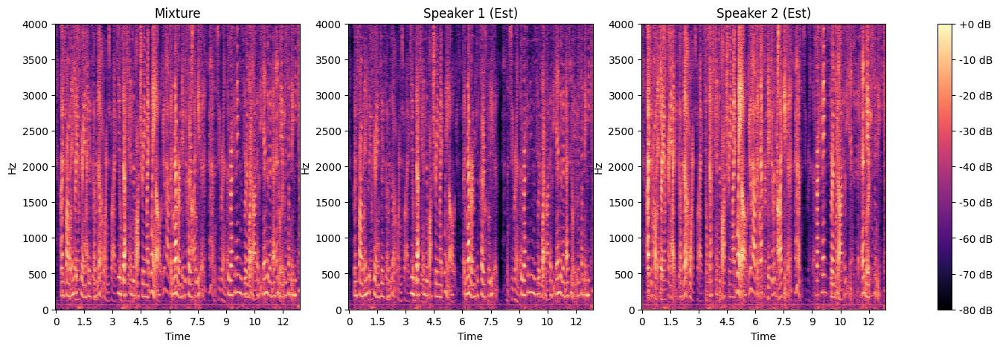


📊 Technical Separation Metrics:


/tmp/ipython-input-4122006718.py:88: FutureWarning: mir_eval.separation.bss_eval_sources
	Deprecated as of mir_eval version 0.8.
	It will be removed in mir_eval version 0.9.
  sdr, sir, sar, _ = mir_eval.separation.bss_eval_sources(ref, est, compute_permutation=True)
/tmp/ipython-input-4122006718.py:89: FutureWarning: mir_eval.separation.bss_eval_sources
	Deprecated as of mir_eval version 0.8.
	It will be removed in mir_eval version 0.9.
  sdr_base, _, _, _ = mir_eval.separation.bss_eval_sources(ref, mix_base, compute_permutation=False) # No perm for mixture baseline


  • SI-SNR Improvement (SI-SNRi): 3.01 dB
  • SDR Improvement (SDRi):       3.39 dB
  • SIR (Interference Rejection): 6.82 dB
  • SAR (Artifacts):              7.35 dB


In [9]:
import os
import glob
import random
import shutil
import IPython.display as ipd
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import mir_eval # Import for metrics

# 1. Define Paths
checkpoint_path = "/content/SepReformer/models/SepReformer_Base_WSJ0/log/scratch_weights/"
# Find the latest checkpoint automatically
checkpoints = sorted(glob.glob(os.path.join(checkpoint_path, "epoch.*.pth")))
latest_ckpt = checkpoints[-1]
print(f"⭐ Using Checkpoint: {os.path.basename(latest_ckpt)}")

# 2. Pick a random test file
# Changed to local dataset path
mix_dir = '/content/dataset/mix_clean'
files = [f for f in os.listdir(mix_dir) if f.endswith('.wav') and '_in' not in f and '_out' not in f]
test_file = random.choice(files)
test_file_path = os.path.join(mix_dir, test_file)

print(f"🎵 Separating: {test_file}")

# 3. Run Inference
!python run.py \
  --model SepReformer_Base_WSJ0 \
  --engine-mode infer_sample \
  --sample-file "{test_file_path}" \
  --out-wav-dir "final_results_90ep" > /dev/null 2>&1

# 4. Locate and Move Files (Handling the path bug we saw earlier)
# The model likely saved them in the source folder again due to the bug
base_name = os.path.splitext(test_file)[0]
path_mix = os.path.join(mix_dir, f"{base_name}_in.wav")
path_s1 = os.path.join(mix_dir, f"{base_name}_out_0.wav")
path_s2 = os.path.join(mix_dir, f"{base_name}_out_1.wav")

if os.path.exists(path_s1):
    print("✅ Separation successful!\n")

    # Audio Player
    print("🎧 Original Mixture:")
    ipd.display(ipd.Audio(path_mix))

    print("🗣️ Speaker 1 (Est):")
    ipd.display(ipd.Audio(path_s1))

    print("🗣️ Speaker 2 (Est):")
    ipd.display(ipd.Audio(path_s2))

    # Visualization
    fig, ax = plt.subplots(1, 3, figsize=(18, 5))

    def plot_spec(ax, p, title):
        y, sr = librosa.load(p, sr=8000)
        D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
        img = librosa.display.specshow(D, y_axis='linear', x_axis='time', sr=sr, ax=ax)
        ax.set_title(title)
        return img, y

    img, y_mix = plot_spec(ax[0], path_mix, "Mixture")
    _, y_s1_est = plot_spec(ax[1], path_s1, "Speaker 1 (Est)")
    _, y_s2_est = plot_spec(ax[2], path_s2, "Speaker 2 (Est)")
    fig.colorbar(img, ax=ax, format="%+2.0f dB")
    plt.show()

    # --- 5. Technical Metrics (Ground Truth Comparison) ---
    print("\n📊 Technical Separation Metrics:")

    # Construct GT paths (Assuming s1/s2 sibling folders)
    base_speech_dir = os.path.dirname(mix_dir)
    gt_s1_path = os.path.join(base_speech_dir, 's1', test_file)
    gt_s2_path = os.path.join(base_speech_dir, 's2', test_file)

    if os.path.exists(gt_s1_path) and os.path.exists(gt_s2_path):
        # Load GT
        y_s1_gt, _ = librosa.load(gt_s1_path, sr=8000)
        y_s2_gt, _ = librosa.load(gt_s2_path, sr=8000)

        # Truncate to min length
        min_L = min(len(y_mix), len(y_s1_gt), len(y_s2_gt), len(y_s1_est), len(y_s2_est))
        ref = np.vstack([y_s1_gt[:min_L], y_s2_gt[:min_L]])
        est = np.vstack([y_s1_est[:min_L], y_s2_est[:min_L]])
        mix_base = np.vstack([y_mix[:min_L], y_mix[:min_L]])

        # Calculate BSS Eval (SDR, SIR, SAR)
        # compute_permutation=True allows mir_eval to match speakers automatically
        sdr, sir, sar, _ = mir_eval.separation.bss_eval_sources(ref, est, compute_permutation=True)
        sdr_base, _, _, _ = mir_eval.separation.bss_eval_sources(ref, mix_base, compute_permutation=False) # No perm for mixture baseline

        # Calculate SI-SNR
        def si_snr(target, estimate):
            # Zero mean
            target = target - np.mean(target)
            estimate = estimate - np.mean(estimate)
            dot = np.sum(target * estimate)
            s_target = (dot * target) / np.sum(target ** 2)
            e_noise = estimate - s_target
            return 10 * np.log10(np.sum(s_target ** 2) / np.sum(e_noise ** 2))

        # We assume mir_eval resolved permutation for SDR, but we need it for SI-SNR.
        # Simpler approach: Calculate all permutations for SI-SNR and take max.
        sisnr_1 = si_snr(ref[0], est[0]) + si_snr(ref[1], est[1])
        sisnr_2 = si_snr(ref[0], est[1]) + si_snr(ref[1], est[0])
        avg_sisnr = max(sisnr_1, sisnr_2) / 2

        # Baseline SI-SNR
        avg_base_sisnr = (si_snr(ref[0], mix_base[0]) + si_snr(ref[1], mix_base[1])) / 2

        print(f"  • SI-SNR Improvement (SI-SNRi): {avg_sisnr - avg_base_sisnr:.2f} dB")
        print(f"  • SDR Improvement (SDRi):       {np.mean(sdr - sdr_base):.2f} dB")
        print(f"  • SIR (Interference Rejection): {np.mean(sir):.2f} dB")
        print(f"  • SAR (Artifacts):              {np.mean(sar):.2f} dB")
    else:
        print(f"  ⚠️ Ground truth files not found at {gt_s1_path}. Cannot calculate metrics.")

else:
    print("❌ Output files not found. Check if the model saved to a different location.")

# **save model**

In [ ]:
import os
import shutil
import glob

# 1. Define Paths
# Source directories
model_root = "/content/SepReformer/models/SepReformer_Base_WSJ0"
weights_dir = os.path.join(model_root, "log", "scratch_weights")
log_dir = os.path.join(model_root, "log")
loss_log_path = "loss_log.txt" # Relative to CWD (/content/SepReformer)

# Destination directory in Drive (Persistent storage)
dest_dir = "/content/drive/MyDrive/תואר/speech/SepReformer_original_Saved_Model"
os.makedirs(dest_dir, exist_ok=True)

# 2. Identify Files to Save
files_to_save = {}

# A. Latest Checkpoint
checkpoints = sorted(glob.glob(os.path.join(weights_dir, "epoch.*.pth")))
if not checkpoints:
    print("❌ No checkpoints found in scratch_weights (yet).")
else:
    latest_ckpt = checkpoints[-1]
    ckpt_name = os.path.basename(latest_ckpt)
    files_to_save[latest_ckpt] = os.path.join(dest_dir, ckpt_name)

# B. Config and Patched Code (Critical for reproducibility)
files_to_save[os.path.join(model_root, "configs.yaml")] = os.path.join(dest_dir, "configs.yaml")
files_to_save[os.path.join(model_root, "dataset.py")] = os.path.join(dest_dir, "dataset.py")
files_to_save[os.path.join(model_root, "engine.py")] = os.path.join(dest_dir, "engine.py")

# C. Logs (Training Loss Text and TensorBoard Events)
# 1. Custom CSV Log (Epoch, Train Loss, Val Loss)
if os.path.exists(loss_log_path):
    files_to_save[loss_log_path] = os.path.join(dest_dir, "loss_log.txt")
else:
    print(f"⚠️ {loss_log_path} not found (Training might not have started or log patch failed).")

# 2. TensorBoard Events (For Learning Curves)
# These contain the 'tanserflow' / TensorBoard history
if os.path.exists(log_dir):
    tb_files = glob.glob(os.path.join(log_dir, "events.out.tfevents*"))
    if tb_files:
        print(f"✅ Found {len(tb_files)} TensorBoard event file(s).")
        for tb_file in tb_files:
            files_to_save[tb_file] = os.path.join(dest_dir, os.path.basename(tb_file))
    else:
        print("⚠️ No TensorBoard event files found in log directory.")

print(f"💾 Saving {len(files_to_save)} files to: {dest_dir} ...")

# 3. Copy Files
for src, dst in files_to_save.items():
    if os.path.exists(src):
        try:
            shutil.copy2(src, dst)
            print(f"✅ Saved: {os.path.basename(src)}")
        except Exception as e:
            print(f"⚠️ Error saving {os.path.basename(src)}: {e}")
    else:
         print(f"⚠️ Warning: Source file not found: {src}")

# **load model**

In [11]:
import os
import shutil
import glob
from google.colab import drive

# --- 1. Mount Drive ---
drive.mount('/content/drive')

# --- 2. Setup Repository (Clone & Install) ---
if not os.path.exists('/content/SepReformer'):
    print("🚀 Cloning SepReformer...")
    !git clone https://github.com/dmlguq456/SepReformer.git
    %cd SepReformer
    print("📦 Installing dependencies...")
    !pip install -r requirements.txt
    !pip install loguru torchinfo ptflops thop mir_eval
else:
    print("✅ Repository already exists.")
    %cd /content/SepReformer

# --- 3. Restore Saved Model ---
# Paths
saved_models_dir = '/content/drive/MyDrive/תואר/speech/SepReformer_original_Saved_Model'
model_root = 'models/SepReformer_Base_WSJ0' # Relative to /content/SepReformer
log_dir = os.path.join(model_root, 'log')

print(f"🔄 Restoring model files from: {saved_models_dir}")

# Create directories
os.makedirs(os.path.join(model_root, 'log', 'scratch_weights'), exist_ok=True)

# A. Restore Config and Scripts
files_to_copy = ['configs.yaml', 'dataset.py', 'engine.py', 'loss_log.txt']

for fname in files_to_copy:
    src = os.path.join(saved_models_dir, fname)
    # loss_log.txt goes to current working directory, others go to model_root
    dst = os.path.join(model_root, fname) if fname != 'loss_log.txt' else fname
    if os.path.exists(src):
        shutil.copy2(src, dst)
        print(f"  - Restored {fname}")
    else:
        print(f"  ℹ️ {fname} not found in backup")

# B. Restore Checkpoint
saved_ckpts = sorted(glob.glob(os.path.join(saved_models_dir, "epoch.*.pth")))
if saved_ckpts:
    latest_ckpt = saved_ckpts[-1]
    ckpt_name = os.path.basename(latest_ckpt)
    dst_ckpt = os.path.join(model_root, 'log', 'scratch_weights', ckpt_name)
    shutil.copy2(latest_ckpt, dst_ckpt)
    print(f"  - Restored Checkpoint: {ckpt_name}")
else:
    print("  ❌ No checkpoint found to restore!")

# C. Restore TensorBoard Logs (For Learning Curves)
# We look for any file containing 'tfevents' to ensure we catch renamed files
saved_tb_logs = glob.glob(os.path.join(saved_models_dir, "*tfevents*"))
if saved_tb_logs:
    print(f"  Found {len(saved_tb_logs)} TensorBoard log files for learning curves.")
    for src in saved_tb_logs:
        dst = os.path.join(log_dir, os.path.basename(src))
        shutil.copy2(src, dst)
        print(f"  - Restored TB Log: {os.path.basename(src)}")
else:
    print("  ℹ️ No TensorBoard logs found in backup (Learning curves might not be available).")

print("\n🎉 Ready! The environment is set up and the model is loaded.")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✅ Repository already exists.
/content/SepReformer
🔄 Restoring model files from: /content/drive/MyDrive/תואר/speech/SepReformer_original_Saved_Model
  - Restored configs.yaml
  - Restored dataset.py
  - Restored engine.py
  - Restored loss_log.txt
  - Restored Checkpoint: epoch.0018.pth
  ℹ️ No TensorBoard logs found in backup (Learning curves might not be available).

🎉 Ready! The environment is set up and the model is loaded.


📈 Plotting learning curves from loss_log.txt...


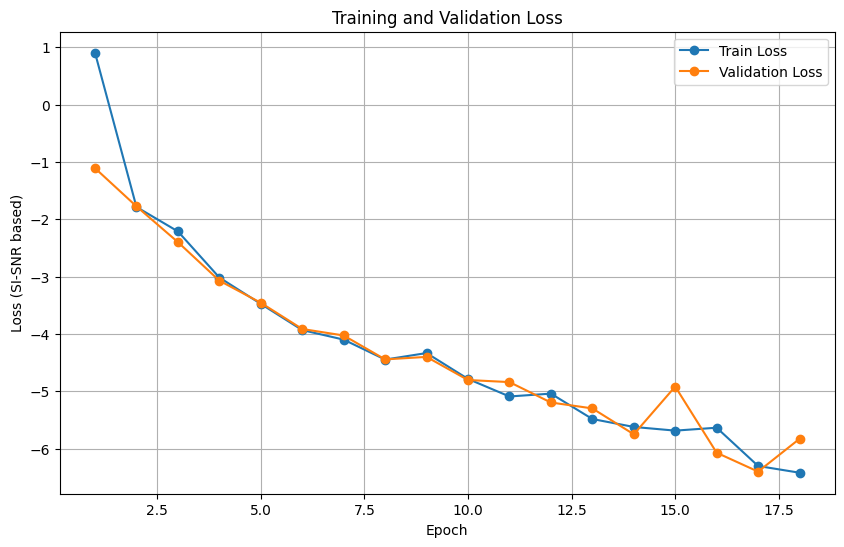

Tail of the log data:
    epoch  train_loss  val_loss
13     14   -5.622943 -5.751187
14     15   -5.687369 -4.918415
15     16   -5.636499 -6.073007
16     17   -6.304090 -6.402280
17     18   -6.421625 -5.829896


In [12]:
import pandas as pd
import matplotlib.pyplot as plt
import os

log_file = "loss_log.txt"

if os.path.exists(log_file):
    print(f"📈 Plotting learning curves from {log_file}...")
    try:
        # Load the data
        df = pd.read_csv(log_file)

        # Plot
        plt.figure(figsize=(10, 6))
        plt.plot(df['epoch'], df['train_loss'], label='Train Loss', marker='o')
        plt.plot(df['epoch'], df['val_loss'], label='Validation Loss', marker='o')

        plt.title('Training and Validation Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss (SI-SNR based)')
        plt.legend()
        plt.grid(True)
        plt.show()

        print("Tail of the log data:")
        print(df.tail())
    except Exception as e:
        print(f"❌ Error reading or plotting log file: {e}")
        # Print first few lines to debug format
        with open(log_file, 'r') as f:
            print("File content sample:")
            print(f.read(200))
else:
    print(f"❌ {log_file} not found. Ensure the model was trained with the logging patch active.")